In [1]:
# -*- coding: utf-8 -*-
"""
@author: Andrey.Bezrukov
"""

import time
from datetime import datetime
import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy import interpolate
from sklearn.cluster import DBSCAN
import numpy as np

##################################################
####### define  functions 
##################################################

class file_Sorption:
    
    def read_file(self, path, filename):
        #print(path +'/'+ filename)        
        try:
            df = pd.read_excel(path + filename, sheet_name='DVS Data')
            if df.columns[0] == 'DVS-INTRINSIC DATA FILE':
                self.filename = filename
                self.instrument = df.columns[0].split()[0]
                self.sample_mass = df.iloc[4, 7]
                self.fluid = 'water vapor'
                comments  = str(df.iloc[3, 1])
                method = str(df.iloc[1, 1])
                df.columns = df.iloc[22, :]
                df = df.iloc[23:, :]
                df = df.reset_index(drop=True)
                df = df.astype('float')
                # renaming columns to common notation
                df = df[['Time (min)', 'dm (%) - ref', 'Target RH (%)', 'Actual RH (%)', 'Target Sample Temp', 'Actual Sample Temp']]
                df.columns = ['time', 'uptake', 'RH_target', 'RH_actual', 'temp_target', 'temp_actual']
                self.temperature = 'Actual Sample Temp: {0:.2f} +- {1:.2f}'.format(df[df.temp_target==df.temp_target.min()].temp_actual.mean(), df[df.temp_target==df.temp_target.min()].temp_actual.std())
                self.equilibration_interval = '---'
                self.comments = comments
                self.method = method
                self.data = df
                #print(self.data.head())
            elif df.columns[0] == 'DVS-Advantage-Plus-Data-File':
                self.filename = filename
                self.instrument = df.columns[0][:-10]
                self.sample_mass = df.iloc[27, 1]
                self.fluid = 'water vapor'
                comments  = str(df.iloc[8, 1])
                method = str(df.iloc[3, 1])
                df.columns = df.iloc[39, :]
                df = df.iloc[40:, :30]
                df = df.reset_index(drop=True)
                df = df[[i for i in df.columns if (i == i) & (i != 'Chiller State')]]
                df = df.astype('float')
                # renaming columns to common notation
                df = df[['Time [minutes]', 'dm (%) - ref', 'Mass [mg]', 'Target Partial Pressure (Solvent A) [%]', 'Measured Partial Pressure (Solvent A) [%]', 'Target Preheater Temp. [celsius]', 'Measured Preheater Temp. [celsius]']]
                df.columns = ['time', 'uptake', 'mass', 'RH_target', 'RH_actual', 'temp_target', 'temp_actual']
                self.temperature = 'Temp. [celsius]: {0:.2f} +- {1:.2f}'.format(df[df.temp_target==df.temp_target.min()].temp_actual.mean(), df[df.temp_target==df.temp_target.min()].temp_actual.std())
                self.equilibration_interval = '---'
                self.comments = comments
                self.method = method
                self.data = df
                #print(self.data.head())
        except Exception as e:
            print(e)
        #print(self.__dict__.keys())
        # test if import was correct
        if (list(self.__dict__.keys()) == ['filename', 'instrument', 'sample_mass', 'fluid', 'temperature', 'equilibration_interval', 'comments', 'method', 'data'])  :
            print('File {0} read succesfull'.format(filename))
            self.import_success = True
        else:
            self.import_success = False


def Create_WaterSorption_isotherm(Sorption):
    if True:
        Sorption.data['cycle_split'] = Sorption.data['RH_target'].diff().fillna(0)
        split_index_ads = Sorption.data.index[(Sorption.data['cycle_split']>0)].to_list()
        split_index_des = Sorption.data.index[(Sorption.data['cycle_split']<0)].to_list()
        
        index_tuple = [('ads', i) for i in split_index_ads] + [('des', i) for i in split_index_des]
        index_tuple = sorted(index_tuple, key=lambda x: x[1])
        #print(index_tuple)
        isotherm_split = []
        prev = 'ads'
        for i, j in enumerate([i[0] for i in index_tuple]):
            if (j == 'ads')&(prev=='des'):
                isotherm_split.append(index_tuple[i][1])
            prev = j
        print(isotherm_split)
        args = [0]+isotherm_split+[Sorption.data.index.size]
        #args= args[:2]
        print(args)
        
        for start,  end in zip(args, args[1:]):
            print(start,  end)
            split_index_ads = Sorption.data.iloc[start:end].index[(Sorption.data.iloc[start:end]['cycle_split']>0)].to_list()
            split_index_des = Sorption.data.iloc[start:end].index[(Sorption.data.iloc[start:end]['cycle_split']<0)].to_list()
            
            split_index_des.append(Sorption.data.iloc[start:end].index.to_list()[-1])
            split_index_ads = split_index_ads + [split_index_des[0]]
            
            #print(split_index_ads)
            #print(split_index_des)
            isotherm_RHtarget_ads = []
            isotherm_RHactual_ads = []
            isotherm_adsorption = []
            isotherm_RHtarget_des = []
            isotherm_RHactual_des = []
            isotherm_desorption = []
            for i, split in enumerate(split_index_ads[:]):
                isotherm_adsorption.append(Sorption.data[split-10:split].uptake.median())
                if i==0:
                    isotherm_RHtarget_ads.append(Sorption.data[:split_index_ads[i]].RH_target.median())
                    isotherm_RHactual_ads.append(Sorption.data[:split_index_ads[i]].RH_actual.median())
                else:
                    isotherm_RHtarget_ads.append(Sorption.data[split_index_ads[i-1]:split_index_ads[i]].RH_target.median())
                    isotherm_RHactual_ads.append(Sorption.data[split_index_ads[i-1]:split_index_ads[i]].RH_actual.median())
            for i, split in enumerate(split_index_des[:]):
                isotherm_desorption.append(Sorption.data[split-10:split].uptake.median())
                if i == 0:
                    isotherm_RHtarget_des.append(Sorption.data[split_index_ads[-2]:split_index_ads[-1]].RH_target.median())
                    isotherm_RHactual_des.append(Sorption.data[split_index_ads[-2]:split_index_ads[-1]].RH_actual.median())
                else:
                    isotherm_RHtarget_des.append(Sorption.data[split_index_des[i-1]:split_index_des[i]].RH_target.median())
                    isotherm_RHactual_des.append(Sorption.data[split_index_des[i-1]:split_index_des[i]].RH_actual.median())
    return isotherm_RHtarget_ads, [i for i in isotherm_adsorption], isotherm_RHtarget_des, [i for i in isotherm_desorption],  Sorption.data.time.max()- Sorption.data[split_index_ads[0]:split_index_ads[1]].time.min()


In [2]:
window1 = 50
window2 = 10
text_size = 16

result = pd.DataFrame(columns=['name','isotherm','cycleNr','kinetics'], dtype=object)

datetime_stamp = datetime.now().isoformat(timespec='seconds')

#os.mkdir(datetime_stamp+'/')

import_parameters = pd.read_csv('../input_data.csv', sep=',')
import_parameters.cycleNr = import_parameters.cycleNr.astype('int32')
print(import_parameters)

                                    path_kinetics  \
0   ../../../../data/water_sorption/DVS/kinetics/   
1   ../../../../data/water_sorption/DVS/kinetics/   
2   ../../../../data/water_sorption/DVS/kinetics/   
3   ../../../../data/water_sorption/DVS/kinetics/   
4   ../../../../data/water_sorption/DVS/kinetics/   
5   ../../../../data/water_sorption/DVS/kinetics/   
6   ../../../../data/water_sorption/DVS/kinetics/   
7   ../../../../data/water_sorption/DVS/kinetics/   
8   ../../../../data/water_sorption/DVS/kinetics/   
9   ../../../../data/water_sorption/DVS/kinetics/   
10  ../../../../data/water_sorption/DVS/kinetics/   
11  ../../../../data/water_sorption/DVS/kinetics/   
12  ../../../../data/water_sorption/DVS/kinetics/   
13  ../../../../data/water_sorption/DVS/kinetics/   
14  ../../../../data/water_sorption/DVS/kinetics/   
15  ../../../../data/water_sorption/DVS/kinetics/   
16  ../../../../data/water_sorption/DVS/kinetics/   
17  ../../../../data/water_sorption/DVS/kineti

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    Syloid_kinetics_50-100um_27C_12mg-2021-07-15 1...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm          syloid_isotherm_25C-2021-03-19 23-03-21.xls
color                                                            green
name                                                       Syloid AL-1
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 0, dtype: object
File Syloid_kinetics_50-100um_27C_12mg-2021-07-15 13-38-52.xls read succesfull
File syloid_isotherm_25C-2021-03-19 23-03-21.xls read succesfull
Intersection:  [2.902772573997759, 24.161671037841884]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.318359375
0.3275390625
Fitting parameters: k:  0.327539

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


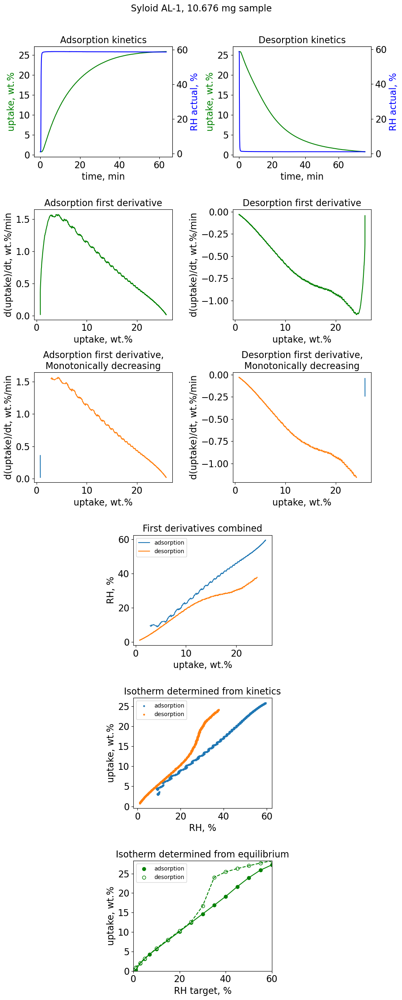

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    Zeolite13X_TGApan_kinetics-2022-05-04 21-27-59...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    20191224_Zeoleite13X - Tue 24 Dec 2019 13-41-5...
color                                                            green
name                                                       Zeolite 13X
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 1, dtype: object
File Zeolite13X_TGApan_kinetics-2022-05-04 21-27-59_dmEnd.xls read succesfull
File 20191224_Zeoleite13X - Tue 24 Dec 2019 13-41-50.xlsx read succesfull
Intersection:  [2.392968961519501, 6.586739050448814]
0.3
0.155
0.22749999999999998
0.26375
0.281875
0.29093749999999996
0.29546874999999995
0.297734375
0.29886718749999996
0.29943359375

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


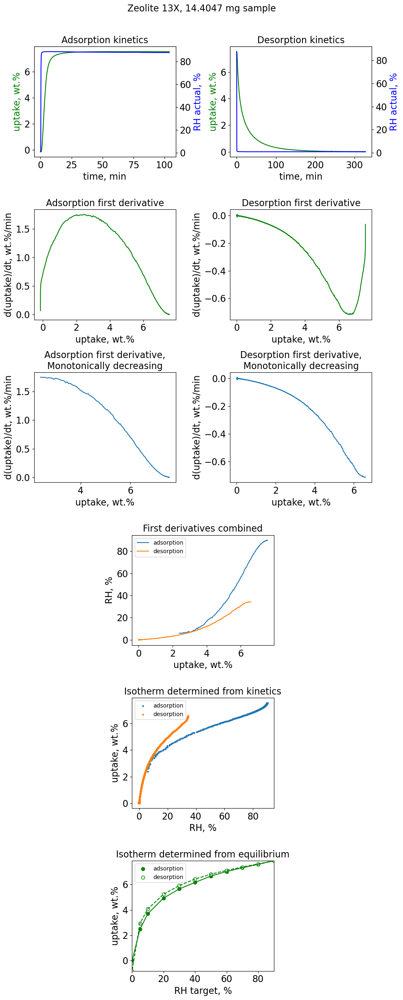

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    CAU-10-H_NK-1-153_kinetics_20mg_27C_50-100-202...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    CAU-10-H_NK-1-1531_isotherm_-2021-06-12 15-33-...
color                                                            green
name                                                          CAU-10-H
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 2, dtype: object
File CAU-10-H_NK-1-153_kinetics_20mg_27C_50-100-2021-06-24 13-11-08_1.xls read succesfull
File CAU-10-H_NK-1-1531_isotherm_-2021-06-12 15-33-08.xlsx read succesfull
Intersection:  [2.0282099724032876, 25.85534970672312]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.318359375
0.3091796875
Fitting par

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


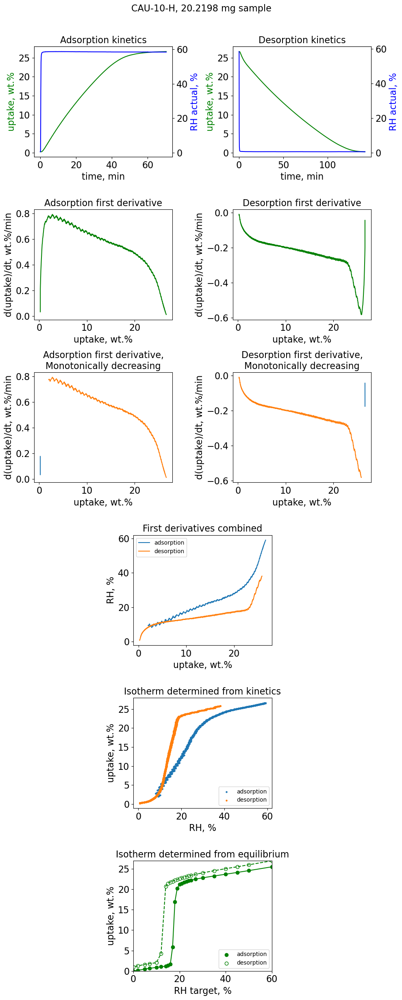

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    MIL-100Fe_SS-2-1232_50-100um_9mg-2022-06-11 19...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    MIL-100Fe_SS-2-1232_isotherm_27C-2021-07-07 00...
color                                                            green
name                                                         MIL-100Fe
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 3, dtype: object
File MIL-100Fe_SS-2-1232_50-100um_9mg-2022-06-11 19-51-35.xls read succesfull
File MIL-100Fe_SS-2-1232_isotherm_27C-2021-07-07 00-30-29.xls read succesfull
Intersection:  [5.776386604276792, 46.22386891738665]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.318359375
0.3091796875
Fitting parameters: k

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


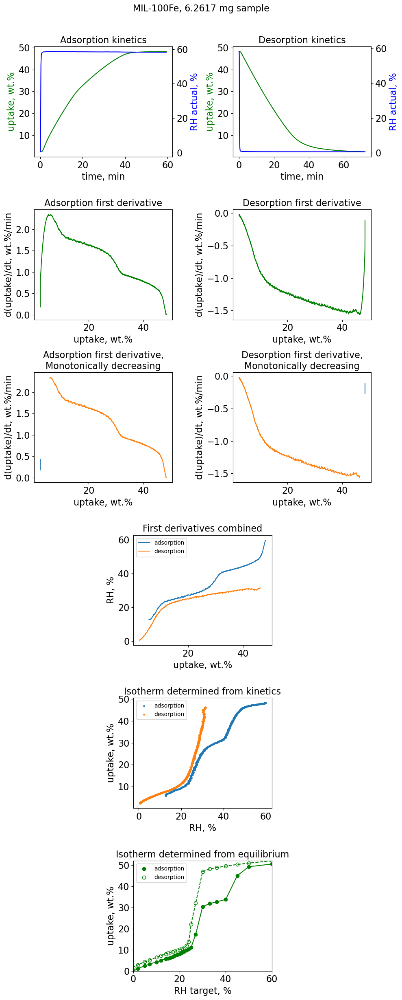

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    MolecularSieve3A_kinetics_TGApan-2022-08-13 18...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    MolecularSieve3A_isotherm_27C-2022-08-14 21-28...
color                                                            green
name                                                        Zeolite 3A
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 4, dtype: object
File MolecularSieve3A_kinetics_TGApan-2022-08-13 18-46-13_dmEnd.xls read succesfull
File MolecularSieve3A_isotherm_27C-2022-08-14 21-28-21.xls read succesfull
Intersection:  [1.2413263223606668, 4.410069869624722]
0.3
0.155
0.22749999999999998
0.26375
0.24562499999999998
0.23656249999999998
0.23203124999999997
0.22976562499999997
0.2308

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


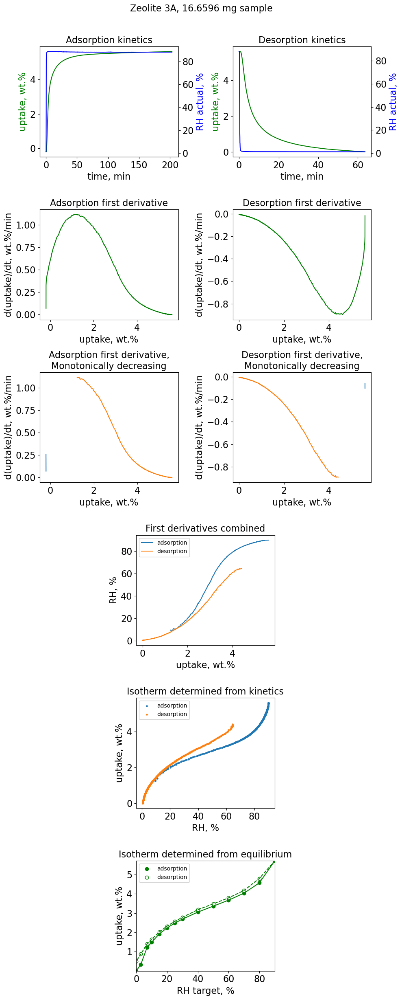

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    activated-charcoal_kinetics_TGApan-2022-08-13 ...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    activated-charcoal_isotherm_27C-2022-08-14 21-...
color                                                            green
name                                                activated-charcoal
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 5, dtype: object
File activated-charcoal_kinetics_TGApan-2022-08-13 18-46-13.xls read succesfull
File activated-charcoal_isotherm_27C-2022-08-14 21-28-21.xls read succesfull
Intersection:  [2.5659083254232984, 26.304132602549572]
0.3
0.155
0.22749999999999998
0.26375
0.24562499999999998
0.23656249999999998
0.24109375
0.238828125
0.2399609375
0.240527343

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


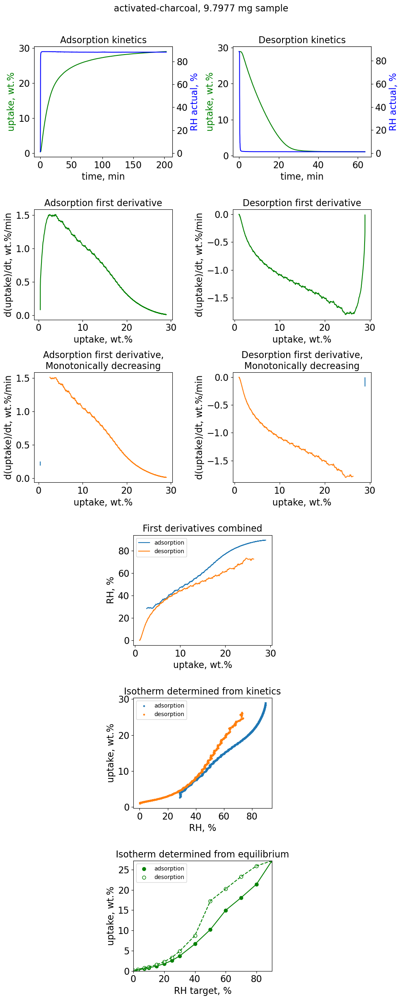

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics      Aluminum oxide_kinetics-2022-06-27 08-22-45.xls
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    Aluminum oxide_isotherm_27C-2022-06-25 06-20-0...
color                                                            green
name                                                          Al oxide
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 6, dtype: object
File Aluminum oxide_kinetics-2022-06-27 08-22-45.xls read succesfull
File Aluminum oxide_isotherm_27C-2022-06-25 06-20-08_1.xls read succesfull
Intersection:  [2.3945908790253845, 17.492315606991387]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.35507812499999997
0.34589843749999993
Fitting paramete

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


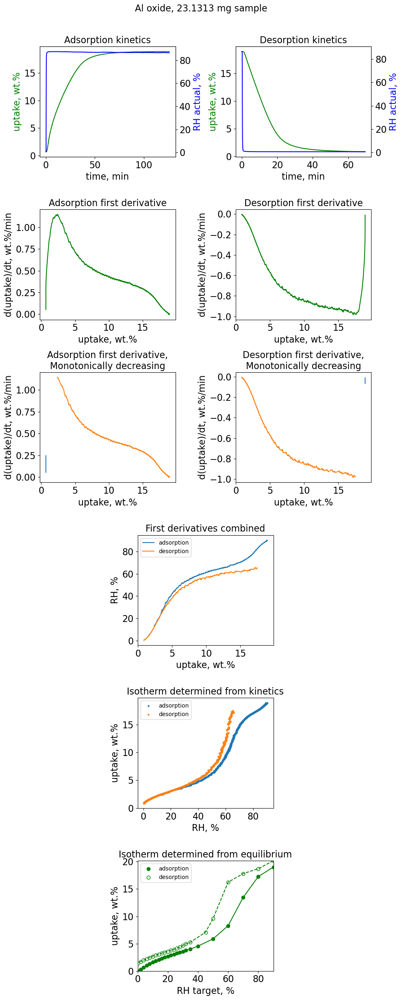

path_kinetics           ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics          Bentonite_kinetics-2022-06-24 19-08-04.xls
path_isotherm          ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    Bentonite_isotherm_27C-2022-06-25 06-20-08_1.xls
color                                                           green
name                                                        bentonite
cycleNr                                                             1
analyze                                                             Y
to_paper                                                          NaN
Name: 7, dtype: object
File Bentonite_kinetics-2022-06-24 19-08-04.xls read succesfull
File Bentonite_isotherm_27C-2022-06-25 06-20-08_1.xls read succesfull
Intersection:  [1.5888198688681512, 14.490126182439003]
0.3
0.155
0.22749999999999998
0.26375
0.281875
0.2728125
0.27734375
0.279609375
0.27847656249999997
0.27904296875
Fitting parameters: k:  0.27904296875
[]
[0

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


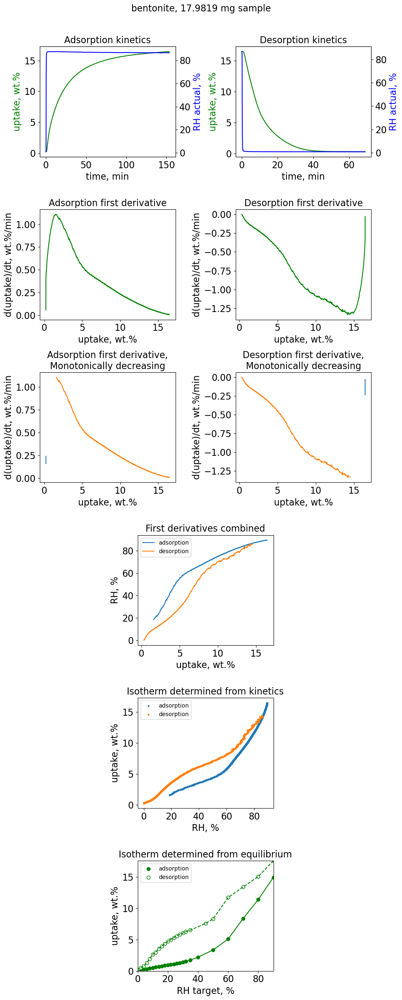

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    Montmorillonite_kinetics_27C_TGApan-2022-10-05...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    Montmorillonite_isotherm_27C_TGApan-2022-10-04...
color                                                            green
name                                                   montmorillonite
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 8, dtype: object
File Montmorillonite_kinetics_27C_TGApan-2022-10-05 16-50-39.xls read succesfull
File Montmorillonite_isotherm_27C_TGApan-2022-10-04 14-48-28.xls read succesfull
Intersection:  [2.7458308450043987, 22.459817501139817]
0.3
0.155
0.22749999999999998
0.26375
0.281875
0.2728125
0.27734375
0.275078125
0.2739453125
0.27337890625
Fitting param

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


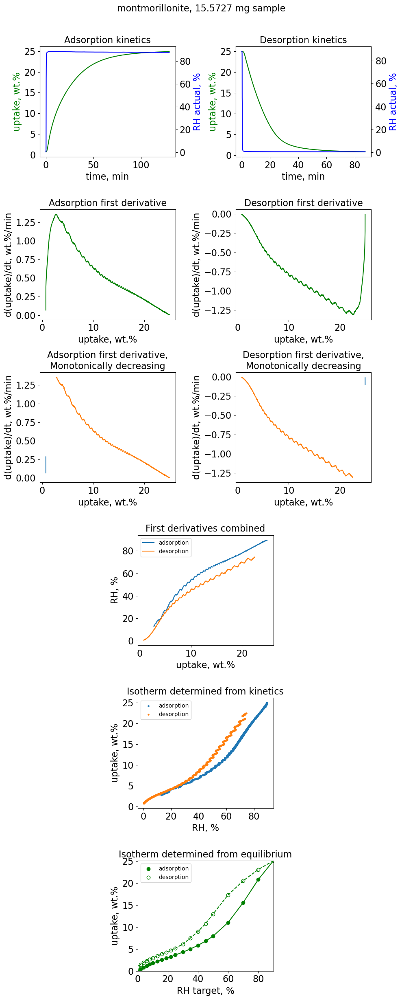

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    microcrystalline_cellulose_TGApan_27C_kinetics...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    microcrystalline_cellulose_isotherm_27C_TGApan...
color                                                            green
name                                                         Cellulose
cycleNr                                                              0
analyze                                                              Y
to_paper                                                           NaN
Name: 9, dtype: object
File microcrystalline_cellulose_TGApan_27C_kinetics-2022-09-11 06-03-54.xls read succesfull
File microcrystalline_cellulose_isotherm_27C_TGApan-2022-10-04 14-48-28.xls read succesfull
Intersection:  [1.276172741846283, 5.464511477154196]
0.3
0.155
0.22749999999999998
0.26375
0.24562499999999998
0.23656249999999998
0.24109375
0.238828125

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


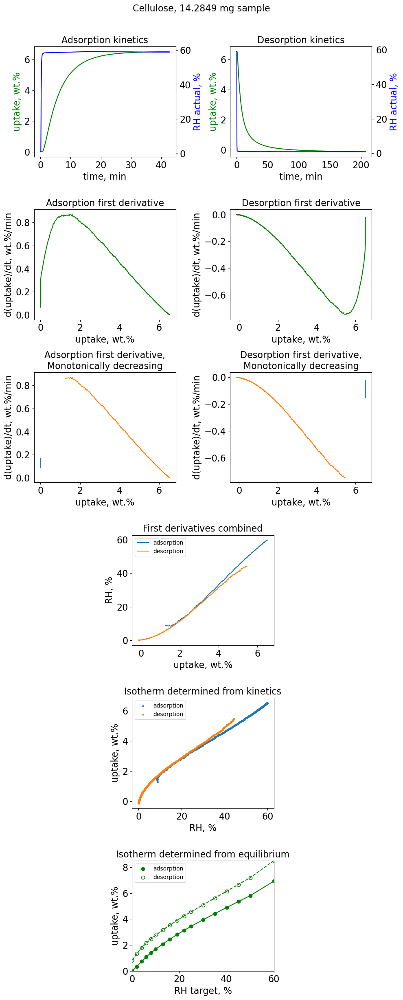

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics          HP-MCP_kinetics_27C-2022-08-18 11-35-52.xls
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    HP-MCP_isotherm_27C_TGApan-2022-10-06 11-58-55...
color                                                            green
name                                                            HP-MCP
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 10, dtype: object
File HP-MCP_kinetics_27C-2022-08-18 11-35-52.xls read succesfull
File HP-MCP_isotherm_27C_TGApan-2022-10-06 11-58-55.xls read succesfull
Intersection:  [1.6132968373841647, 7.6654684562872974]
0.3
0.155
0.22749999999999998
0.26375
0.24562499999999998
0.23656249999999998
0.24109375
0.243359375
0.24449218749999999
0.24505859375
Fitting p

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


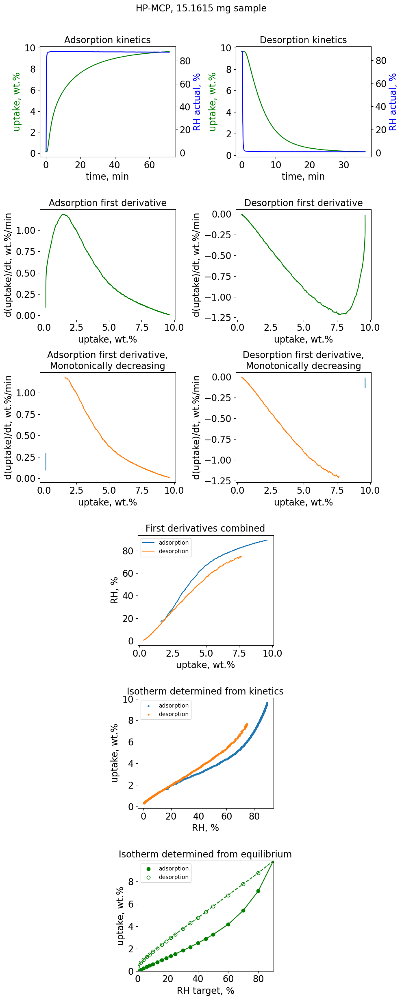

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics      KollidonSR_kinetics_27C-2022-08-18 11-35-52.xls
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    KollidonSR_isotherm_27C_TGApan-2022-10-06 11-5...
color                                                            green
name                                                          Kollidon
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 11, dtype: object
File KollidonSR_kinetics_27C-2022-08-18 11-35-52.xls read succesfull
File KollidonSR_isotherm_27C_TGApan-2022-10-06 11-58-55.xls read succesfull
Intersection:  [1.8179814896430144, 12.217094859098331]
0.3
0.155
0.22749999999999998
0.26375
0.281875
0.29093749999999996
0.29546874999999995
0.297734375
0.29886718749999996
0.29943359375
Fit

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


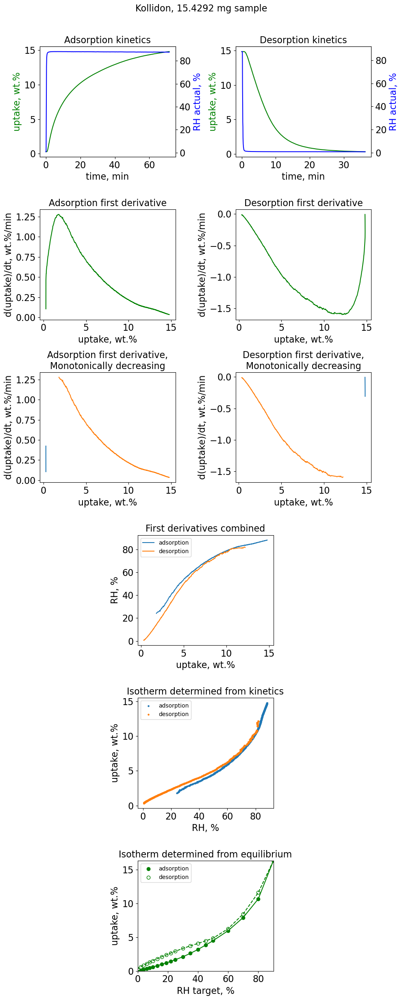

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    Al-fum_NK-1091_50-100um_kinetics_10mg-2022-04-...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    NK1091_Al-fumarate_EtOH_50-100um_27C_isotherm-...
color                                                            green
name                                                       Al-fumarate
cycleNr                                                              4
analyze                                                              Y
to_paper                                                           NaN
Name: 12, dtype: object
File Al-fum_NK-1091_50-100um_kinetics_10mg-2022-04-19 16-39-52.xls read succesfull
File NK1091_Al-fumarate_EtOH_50-100um_27C_isotherm-2022-01-07 09-05-27.xls read succesfull
Intersection:  [2.776140467394452, 36.0981279315927]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.318359375
0.3275390625
Fit

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


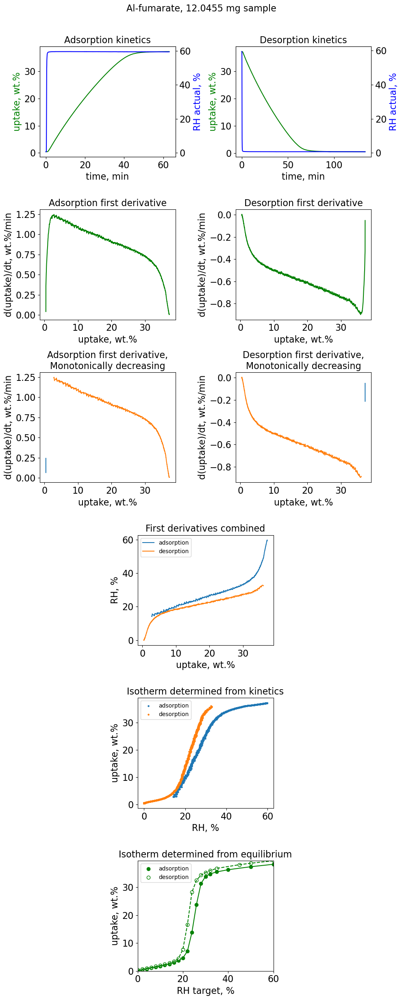

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    MIL-160_DJ2500_kinetics_27C_16mg_50-100um-2021...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm      DJO-02-500_isotherm_27C-2021-05-18 18-59-58.xls
color                                                            green
name                                                           MIL-160
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 13, dtype: object
File MIL-160_DJ2500_kinetics_27C_16mg_50-100um-2021-06-15 17-03-17_1.xls read succesfull
File DJO-02-500_isotherm_27C-2021-05-18 18-59-58.xls read succesfull
Intersection:  [5.213242273800235, 35.18560520148183]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.41015625
0.391796875
0.4009765625
Fitting parameters: k:  0.4

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


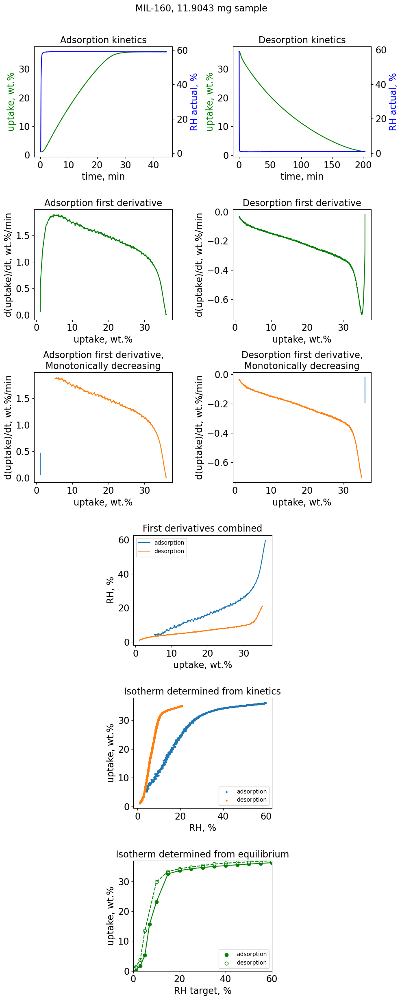

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    MOF-303-SS1131_kinetics_27C_12mg_50-100um-2021...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    MOF-303_SS-1131_isotherm_27C-2021-06-14 09-53-...
color                                                            green
name                                                           MOF-303
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 14, dtype: object
File MOF-303-SS1131_kinetics_27C_12mg_50-100um-2021-06-03 09-37-23.xls read succesfull
File MOF-303_SS-1131_isotherm_27C-2021-06-14 09-53-10.xls read succesfull
Intersection:  [4.702516453050133, 36.799029203610374]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.318359375
0.3275390625
Fitting parame

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


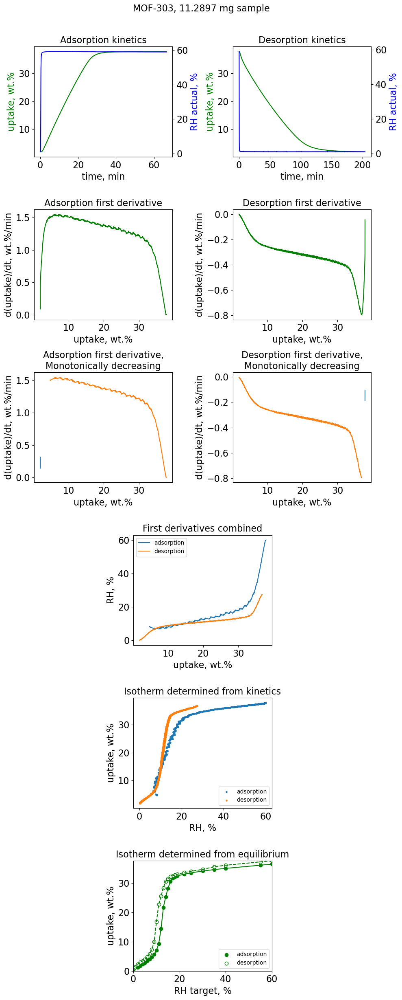

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    ROS-037_50-100um_kinetics_27C_TGApan-2022-10-0...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm        ROS037_-u50_isotherm-2021-05-07 18-07-06.xlsx
color                                                            green
name                                                           ROS-037
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 15, dtype: object
File ROS-037_50-100um_kinetics_27C_TGApan-2022-10-05 16-50-39.xls read succesfull
File ROS037_-u50_isotherm-2021-05-07 18-07-06.xlsx read succesfull
Intersection:  [3.5868716910291254, 9.92322132928348]
0.3
0.155
0.22749999999999998
0.26375
0.281875
0.29093749999999996
0.28640625
0.28867187499999997
0.28753906249999994
0.28810546875
Fi

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


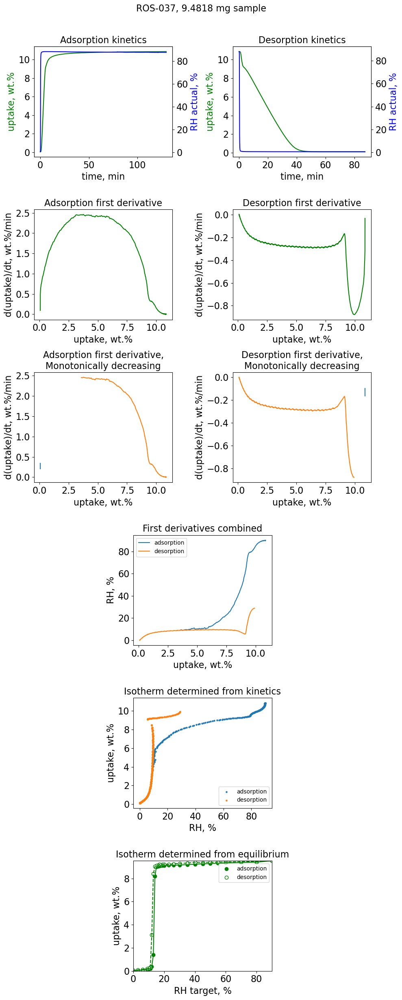

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    ROS039-SD-1-183_kinetics_8mg_50-100um-2021-06-...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm        SD-1-183_isotherm_27C-2021-05-18 18-59-58.xls
color                                                            green
name                                                           ROS-039
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 16, dtype: object
File ROS039-SD-1-183_kinetics_8mg_50-100um-2021-06-04 18-28-36.xls read succesfull
File SD-1-183_isotherm_27C-2021-05-18 18-59-58.xls read succesfull
Intersection:  [5.148140949101713, 21.88376419626246]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.318359375
0.3091796875
Fitting parameters: k:  0.

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


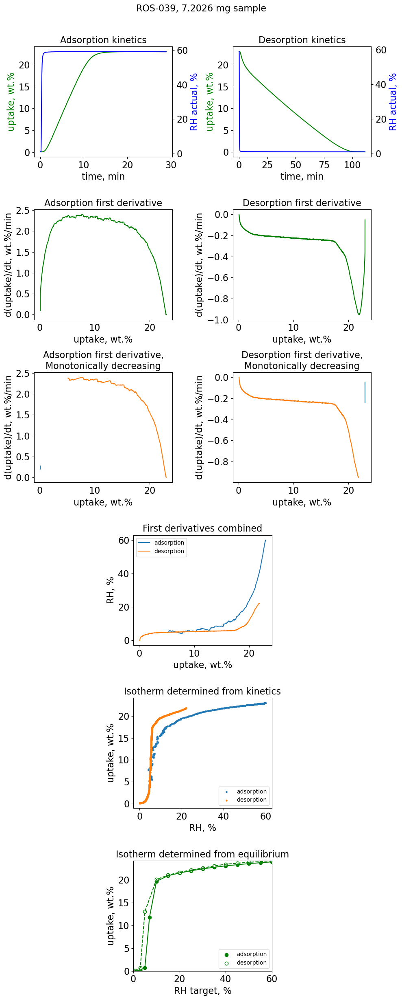

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    ROS-040_SD-1-82_kinetics_9mg_27C_50-100um-2021...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    ROS-040_SD-01-082_isotherm_27C-2021-06-14 09-5...
color                                                            green
name                                                           ROS-040
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 17, dtype: object
File ROS-040_SD-1-82_kinetics_9mg_27C_50-100um-2021-07-02 16-54-13.xls read succesfull
File ROS-040_SD-01-082_isotherm_27C-2021-06-14 09-53-10.xls read succesfull
Intersection:  [3.710178913537338, 14.796746265219179]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.318359375
0.3275390625
Fitting para

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


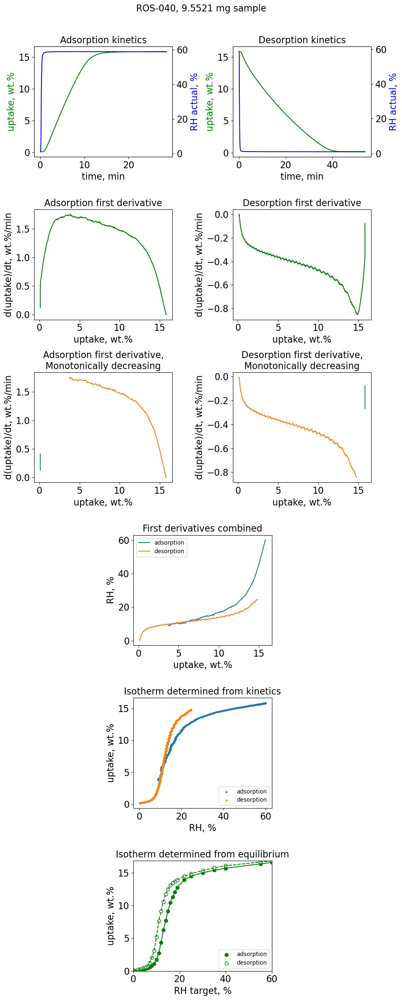

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    AAB-3-96_TGApan_kinetics_27C-2022-08-29 10-24-...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    AAB-3-96_27C_isotherm_TGApan-2022-09-14 17-39-...
color                                                            green
name                                                  [Co2(mal)2(bpy)]
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 18, dtype: object
File AAB-3-96_TGApan_kinetics_27C-2022-08-29 10-24-02.xls read succesfull
File AAB-3-96_27C_isotherm_TGApan-2022-09-14 17-39-17_1.xls read succesfull
Intersection:  [2.75272942399742, 10.757247091303482]
0.3
0.155
0.22749999999999998
0.26375
0.24562499999999998
0.25468749999999996
0.25015624999999997
0.25242187499999996
0.2512890624999

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


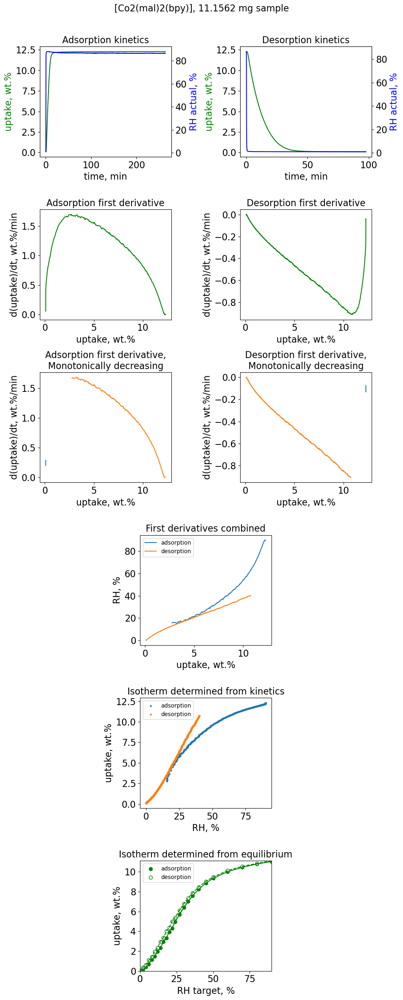

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics       AAB-3-107_kinetics_27C-2022-08-18 21-17-17.xls
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    AAB-3-107_27C_isotherm_TGApan-2022-09-15 11-10...
color                                                            green
name                                                  [Ni2(mal)2(bpy)]
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 19, dtype: object
File AAB-3-107_kinetics_27C-2022-08-18 21-17-17.xls read succesfull
File AAB-3-107_27C_isotherm_TGApan-2022-09-15 11-10-28.xls read succesfull
Intersection:  [4.256300410974331, 10.631014727434843]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.35507812499999997
0.34589843749999993
Fitting parameter

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


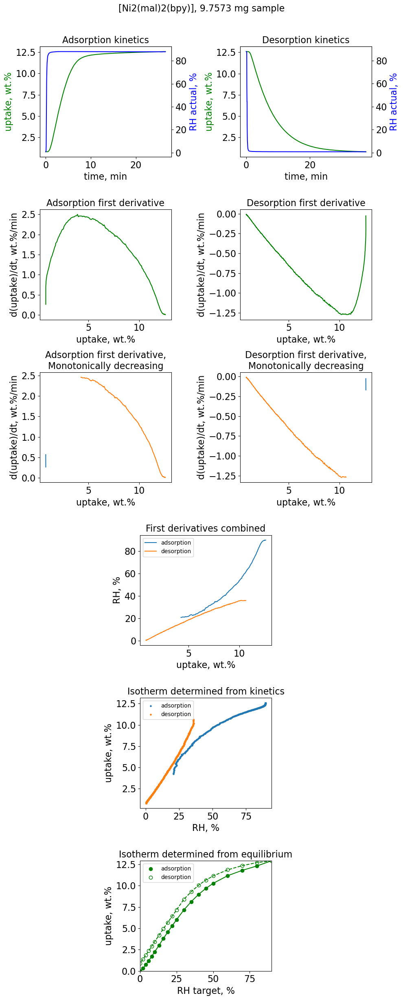

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    20190323_Mg_CUK-1_Kinetics - Sat 23 Mar 2019 1...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    20190323_Mg_CUK-1_3Isoth_27C - Sun 24 Mar 2019...
color                                                            green
name                                                          Mg-CUK-1
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 20, dtype: object
File 20190323_Mg_CUK-1_Kinetics - Sat 23 Mar 2019 16-34-28.xls read succesfull
File 20190323_Mg_CUK-1_3Isoth_27C - Sun 24 Mar 2019 00-20-00.xlsx read succesfull
Intersection:  [4.113424401843538, 30.039184602305046]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.740625
0.6671875
0.70390625
0.685546875
0.6947265625
Fitting parameters: k: 

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


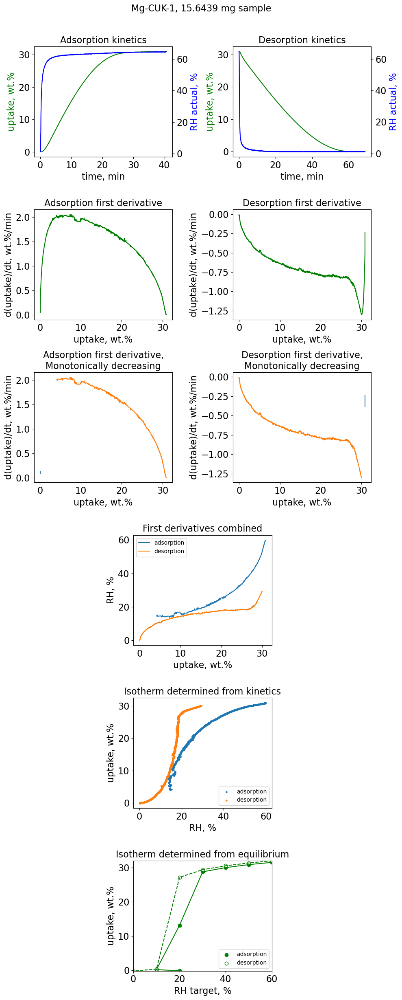

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    20190409_hcp-UIO-66_Kinetics - Tue 09 Apr 2019...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    20190408_hcp-UIO-66 - Mon 08 Apr 2019 11-55-31...
color                                                            green
name                                                        hcp-UiO-66
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 21, dtype: object
File 20190409_hcp-UIO-66_Kinetics - Tue 09 Apr 2019 11-36-25.xls read succesfull
File 20190408_hcp-UIO-66 - Mon 08 Apr 2019 11-55-31.xls read succesfull
Intersection:  [2.0843501873302883, 21.363901969545935]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.5203125
0.48359375
0.465234375
0.4560546875
Fitting parameters: k:  0.4560

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


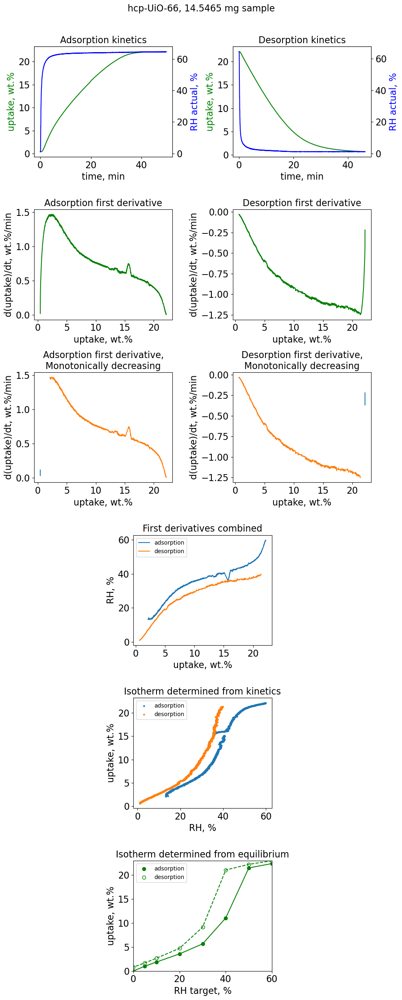

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    20190923_AAB380-AAB382_UiO-NH2-66_Kinetics - T...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    20190923_AAB380-AAB382_UiO-NH2-66 - Mon 23 Sep...
color                                                            green
name                                                        UiO-66-NH2
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 22, dtype: object
File 20190923_AAB380-AAB382_UiO-NH2-66_Kinetics - Tue 24 Sep 2019 10-05-58.xls read succesfull
File 20190923_AAB380-AAB382_UiO-NH2-66 - Mon 23 Sep 2019 15-45-59.xls read succesfull
Intersection:  [7.567945109800947, 36.4782555105898]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.740625
0.6671875
0.70390625
0.7222656249999999
0.713085937

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


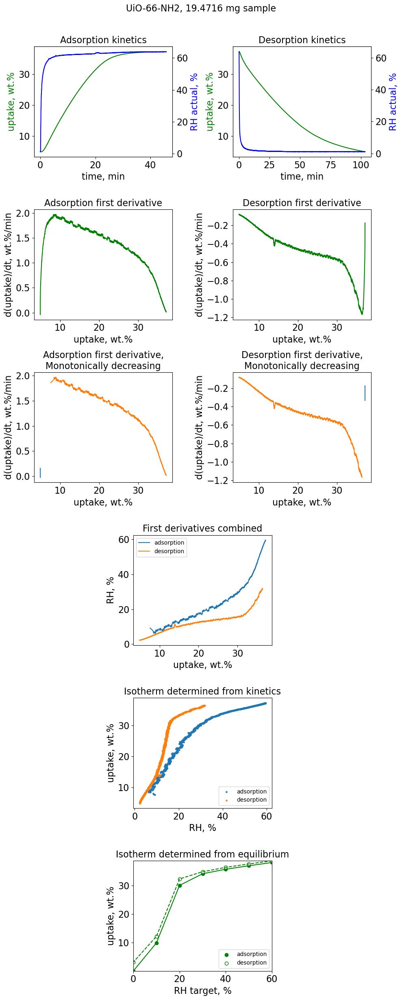

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics       AAB-3-103_kinetics_27C-2022-08-18 21-17-17.xls
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    AAB-3-103_27C_isotherm_TGApan-2022-09-16 12-50...
color                                                            green
name                                                    [Ca2Zr(C2O4)2]
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 23, dtype: object
File AAB-3-103_kinetics_27C-2022-08-18 21-17-17.xls read succesfull
File AAB-3-103_27C_isotherm_TGApan-2022-09-16 12-50-53.xlsx read succesfull
Intersection:  [2.3042944548081885, 7.068500565441374]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.318359375
0.3275390625
Fitting parameters: k:  0.32753

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


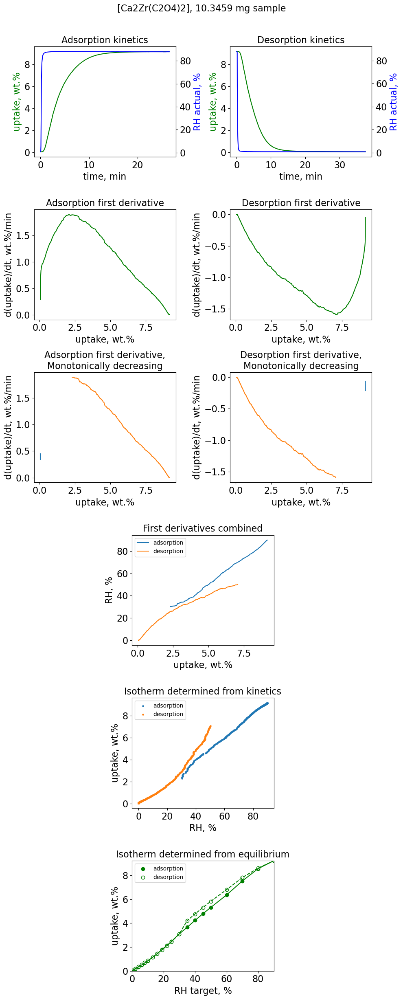

path_kinetics           ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    MS-2005-11_kinetics_10mg-2022-04-19 16-39-52.xls
path_isotherm          ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm       2_MS-200512_Isotherm-2020-07-30 12-52-23.xlsx
color                                                           green
name                                                  [Cu(HQS)(TMBP)]
cycleNr                                                             3
analyze                                                             Y
to_paper                                                          NaN
Name: 24, dtype: object
File MS-2005-11_kinetics_10mg-2022-04-19 16-39-52.xls read succesfull
File 2_MS-200512_Isotherm-2020-07-30 12-52-23.xlsx read succesfull
Intersection:  [3.1930490276400207, 12.910180673537143]
0.3
0.155
0.22749999999999998
0.26375
0.281875
0.2728125
0.27734375
0.279609375
0.2807421875
0.28130859375
Fitting parameters: k:  0.28130859375
[]
[0, 6

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


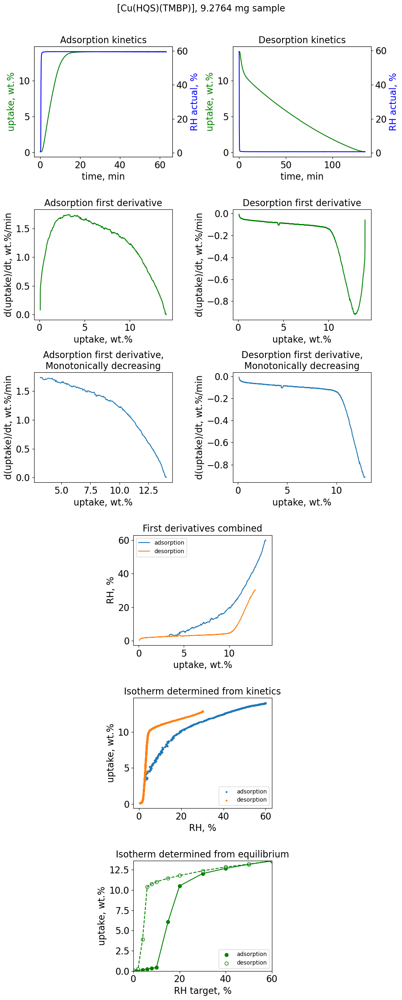

path_kinetics         ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics       LX2134_kinetics_27C-2023-02-22 13-30-52.xls
path_isotherm        ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm     LX2134_2_isotherm_25C-2022-01-13 19-26-53.xls
color                                                         green
name                                            sql-(azpy)(pdia)-Ni
cycleNr                                                           1
analyze                                                           Y
to_paper                                                        NaN
Name: 25, dtype: object
File LX2134_kinetics_27C-2023-02-22 13-30-52.xls read succesfull
File LX2134_2_isotherm_25C-2022-01-13 19-26-53.xls read succesfull
Intersection:  [3.0827199913410435, 9.107452105206175]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.35507812499999997
0.34589843749999993
Fitting parameters: k:  0.34589843749999993
[]
[0, 5016

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


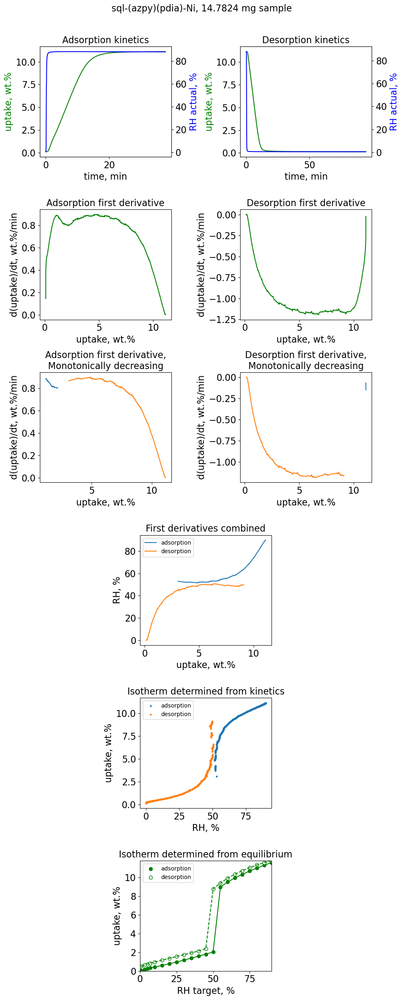

path_kinetics         ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics     AAB-6-42_kinetics_27C-2023-02-22 13-30-52.xls
path_isotherm        ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm     AAB-6-42_isotherm_27C-2023-02-18 20-04-00.xls
color                                                         green
name                                               [Cd(pzdc)(azpy)]
cycleNr                                                           0
analyze                                                           Y
to_paper                                                        NaN
Name: 26, dtype: object
File AAB-6-42_kinetics_27C-2023-02-22 13-30-52.xls read succesfull
File AAB-6-42_isotherm_27C-2023-02-18 20-04-00.xls read succesfull
Intersection:  [2.7765163116372906, 5.899437092737125]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.33671874999999996
0.35507812499999997
0.34589843749999993
Fitting parameters: k:  0.34589843749999993
[]
[0, 42

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


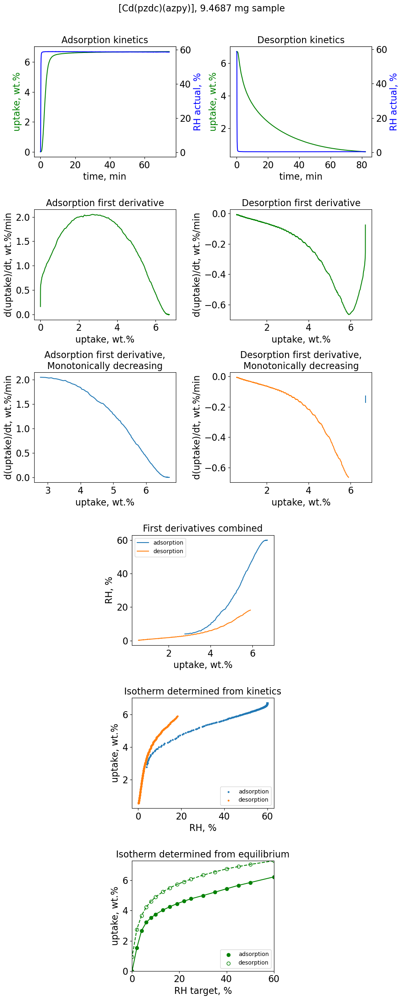

path_kinetics         ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics     AAB-6-41_kinetics_27C-2023-02-25 16-19-20.xls
path_isotherm        ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    AAB-6-41_isotherm_27C-2023-02-23 16-37-53.xlsx
color                                                         green
name                                                       ZPF-2-Co
cycleNr                                                           2
analyze                                                           Y
to_paper                                                        NaN
Name: 27, dtype: object
File AAB-6-41_kinetics_27C-2023-02-25 16-19-20.xls read succesfull
File AAB-6-41_isotherm_27C-2023-02-23 16-37-53.xlsx read succesfull
Intersection:  [1.0368806655904608, 15.097893124715435]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.41015625
0.428515625
0.43769531250000004
Fitting parameters: k:  0.43769531250000004
[]
[0, 84097]
0 84097


C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


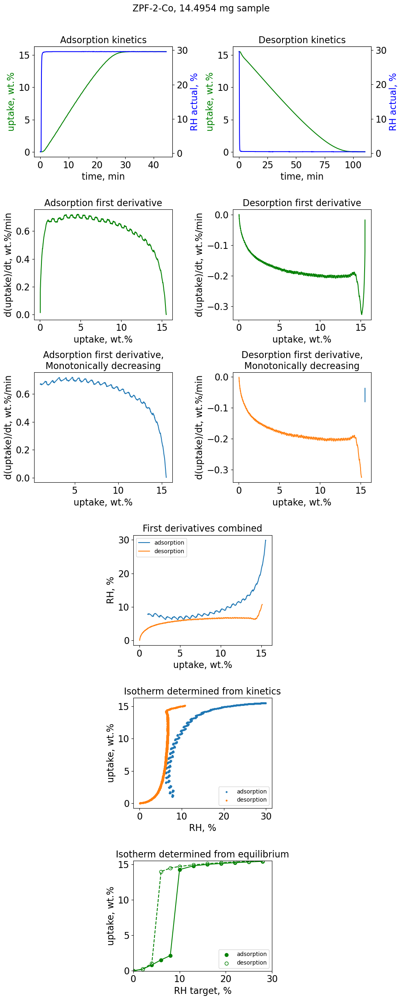

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    AAB-6-35_ground_kinetics_27C_20mg-2023-02-27 1...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm        AAB-6-35_isotherm_27C-2023-02-19 21-31-48.xls
color                                                            green
name                                                    MIL-53(Al)-ADP
cycleNr                                                              1
analyze                                                              Y
to_paper                                                           NaN
Name: 28, dtype: object
File AAB-6-35_ground_kinetics_27C_20mg-2023-02-27 18-31-39.xls read succesfull
File AAB-6-35_isotherm_27C-2023-02-19 21-31-48.xls read succesfull
Intersection:  [1.885589360539267, 11.197394789579162]
0.3
0.155
0.22749999999999998
0.26375
0.24562499999999998
0.25468749999999996
0.25921874999999994
0.25695312499999995
0.2580859375
0.257

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


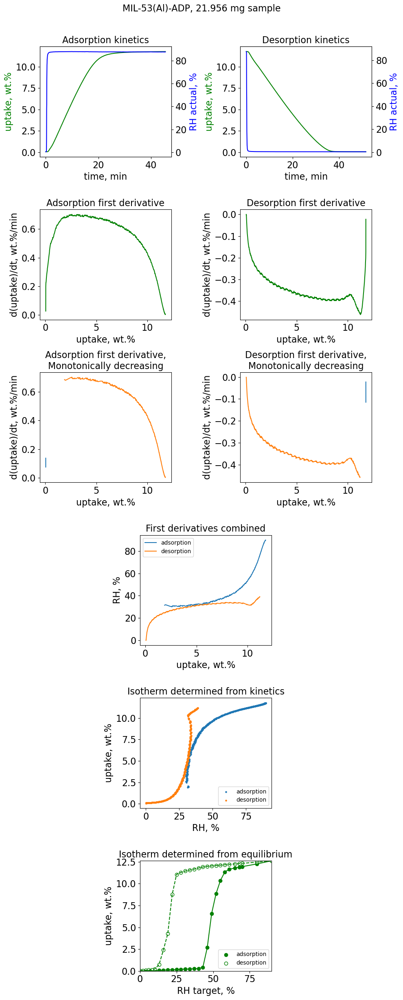

path_kinetics            ../../../../data/water_sorption/DVS/kinetics/
filename_kinetics    AAB-6-40_refluxEtOH_kinetics_27C-2023-02-25 16...
path_isotherm           ../../../../data/water_sorption/DVS/isotherms/
filename_isotherm    AAB-6-40_refluxEtOH_isotherm_27C-2023-02-23 16...
color                                                            green
name                                                     MIL-53(Al)-OH
cycleNr                                                              3
analyze                                                              Y
to_paper                                                           NaN
Name: 29, dtype: object
File AAB-6-40_refluxEtOH_kinetics_27C-2023-02-25 16-19-20.xls read succesfull
File AAB-6-40_refluxEtOH_isotherm_27C-2023-02-23 16-37-53.xlsx read succesfull
Intersection:  [4.518669309476612, 35.433519044302784]
0.3
2.65
1.4749999999999999
0.8875
0.59375
0.446875
0.3734375
0.41015625
0.428515625
0.4193359375
Fitting parameters: k:  0.4

C:\Users\Andrey.Bezrukov\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:361: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


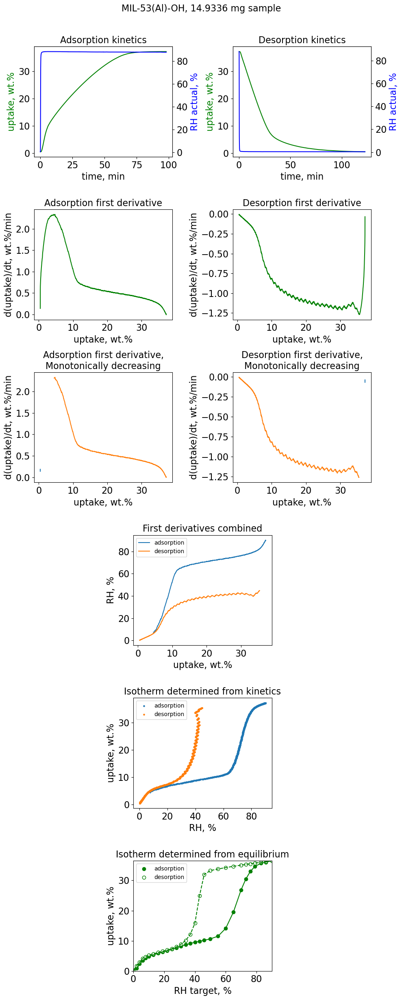

In [3]:
for indx in import_parameters[import_parameters.analyze=='Y'].index:
    print(import_parameters.iloc[indx, :])
    ## import kinetics
    Sorption_kinetics = file_Sorption()
    try:
        Sorption_kinetics.read_file(import_parameters.path_kinetics[indx],import_parameters.filename_kinetics[indx])
        if Sorption_kinetics.import_success:
            if Sorption_kinetics.fluid != 'water vapor':
                del Sorption_kinetics
                print('Wrong fluid: ',Sorption_kinetics.fluid)
        else:
            del Sorption_kinetics
            print(import_parameters.filename_kinetics[indx], 'failed')
            continue
    except Exception as e:
        print(e)
        print(import_parameters.filename_kinetics[indx], 'failed')
        continue
        
    ## import isotherm
    Sorption_isotherm = file_Sorption()
    try:
        Sorption_isotherm.read_file(import_parameters.path_isotherm[indx],import_parameters.filename_isotherm[indx])
        if Sorption_isotherm.import_success:
            if Sorption_isotherm.fluid != 'water vapor':
                del Sorption_isotherm
                print('Wrong fluid: ',Sorption_isotherm.fluid)
        else:
            del Sorption_isotherm
            print(import_parameters.filename_isotherm[indx], 'failed')
    except Exception as e:
        print(e)
        print(import_parameters.filename_isotherm[indx], 'failed')
        continue
    
    Sorption_kinetics.data['cycle_split'] = Sorption_kinetics.data['RH_target'].diff().fillna(0)
    Sorption_kinetics.data['cycle_split_temp'] = Sorption_kinetics.data['temp_target'].diff().fillna(0)
    split_index_ads = Sorption_kinetics.data.index[(Sorption_kinetics.data['cycle_split']>0)].to_list()
    split_index_des = Sorption_kinetics.data.index[(Sorption_kinetics.data['cycle_split']<0)].to_list()
    split_index_temp = Sorption_kinetics.data.index[(Sorption_kinetics.data['cycle_split_temp']!=0)].to_list()
    
    
    fig, ax = plt.subplot_mosaic(    
    """
    AABB
    CCDD
    EEFF
    .GG.
    .HH.
    .JJ.
    """
                              ,figsize=(10, 25), constrained_layout=True)
    fig.suptitle(''.join([import_parameters.name[indx], ', ', str(Sorption_kinetics.sample_mass), ' mg sample' ]),
                         fontsize=text_size)
    
    # uptake adsorption
    try:
        w_ads = pd.DataFrame({'time':Sorption_kinetics.data.iloc[split_index_ads[import_parameters.cycleNr[indx]]:split_index_des[import_parameters.cycleNr[indx]], :]['time'] - Sorption_kinetics.data.iloc[split_index_ads[import_parameters.cycleNr[indx]]:split_index_des[import_parameters.cycleNr[indx]], :]['time'].min(), 
                              'uptake':Sorption_kinetics.data.iloc[split_index_ads[import_parameters.cycleNr[indx]]:split_index_des[import_parameters.cycleNr[indx]], :]['uptake'],
                              'RH_actual':Sorption_kinetics.data.iloc[split_index_ads[import_parameters.cycleNr[indx]]:split_index_des[import_parameters.cycleNr[indx]], :]['RH_actual']
                              })
    except Exception as e:
        print(e)
        continue
    ax['A'].plot(w_ads['time'],
                  w_ads['uptake'],
                  c=import_parameters.color[indx],
                  label=''.join([import_parameters.name[indx], ', ', str(Sorption_kinetics.sample_mass), ' mg' ])
                  )
    #ax['A'].legend()
    ax['A'].set_xlabel('time, min', fontsize=text_size)
    ax['A'].set_ylabel('uptake, wt.%', fontsize=text_size, c=import_parameters.color[indx])
    ax['A'].tick_params(axis='x', labelsize=text_size)
    ax['A'].tick_params(axis='y', labelsize=text_size)
    ax['A'].set_title('Adsorption kinetics', fontsize=text_size)
    ax2 = ax['A'].twinx()
    ax2.plot(w_ads['time'],
             w_ads['RH_actual'], 
             c='b'
             )
    ax2.set_ylabel('RH actual, %', fontsize=text_size, c='b')
    ax2.tick_params(axis='y', labelsize=text_size)
    
    # first derivative adsorption
    first_derivative_dwdt_ads = pd.DataFrame({'dwdt':(w_ads['uptake'].diff()/w_ads['time'].diff()).rolling(window=window1, min_periods=1, center=True).mean(),
                                              'uptake':w_ads['uptake']
                                              })
    ax['C'].plot(first_derivative_dwdt_ads['uptake'], 
                  first_derivative_dwdt_ads['dwdt'],
                  c=import_parameters.color[indx],
                  label=''.join([import_parameters.name[indx], ', ',str(Sorption_kinetics.sample_mass), ' mg' ])
                  )
    ax['C'].set_xlabel('uptake, wt.%', fontsize=text_size)
    ax['C'].set_ylabel('d(uptake)/dt, wt.%/min', fontsize=text_size)
    ax['C'].tick_params(axis='x', labelsize=text_size)
    ax['C'].tick_params(axis='y', labelsize=text_size)
    ax['C'].set_title('Adsorption first derivative', fontsize=text_size)
    
    # first derivative adsorption where second derivative is negatinve
    first_derivative_dwdt_dw_ads = pd.DataFrame({'dwdt_dw':(first_derivative_dwdt_ads['dwdt'].diff()/first_derivative_dwdt_ads['uptake'].diff()).rolling(window=window2, min_periods=1, center=True).mean(),
                                                 'uptake':first_derivative_dwdt_ads['uptake']
                                                 })
    def normalize(x):
        return (x-x.min())/(x.max()-x.min())
    X = np.array([[i[0], i[1]] for i in zip(normalize(first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0]['uptake']), normalize(first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0]['dwdt']))  ])
    clustering_ads = DBSCAN(eps=0.1, min_samples=1).fit(X)
    #print(clustering_ads.labels_)
    for i in list(set(clustering_ads.labels_)):    
        ax['E'].plot(first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0]['uptake'][clustering_ads.labels_==i],
                      first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0]['dwdt'][clustering_ads.labels_==i],
                      #c=import_parameters.color[indx],
                      label=''.join([import_parameters.name[indx], ', ', str(Sorption_kinetics.sample_mass), ' mg' ])
                      ) 
    ax['E'].set_xlabel('uptake, wt.%', fontsize=text_size)
    ax['E'].set_ylabel('d(uptake)/dt, wt.%/min', fontsize=text_size)
    ax['E'].tick_params(axis='x', labelsize=text_size)
    ax['E'].tick_params(axis='y', labelsize=text_size)
    ax['E'].set_title('Adsorption first derivative,\nMonotonically decreasing', fontsize=text_size)
    
    # uptake desorption
    try:
        temp_index = [split_index_des[import_parameters.cycleNr[indx]], split_index_ads[import_parameters.cycleNr[indx]+1]]
    except: 
        temp_index = [split_index_des[import_parameters.cycleNr[indx]], Sorption_kinetics.data.index.max()]
    if [i for i in split_index_temp if (i>temp_index[0])&(i<temp_index[1])] != []:
        temp_index = [temp_index[0], min(min([i for i in split_index_temp if (i>temp_index[0])&(i<temp_index[1])]), temp_index[1])]
    try:
        w_des = pd.DataFrame({'time':Sorption_kinetics.data.iloc[temp_index[0]:temp_index[1], :]['time'] - Sorption_kinetics.data.iloc[temp_index[0]:temp_index[1], :]['time'].min(), 
                              'uptake':Sorption_kinetics.data.iloc[temp_index[0]:temp_index[1], :]['uptake'], 
                              'RH_actual':Sorption_kinetics.data.iloc[temp_index[0]:temp_index[1], :]['RH_actual'], 
                              })
    except Exception as e:
        print(e)
        continue      
    ax['B'].plot(w_des['time'],
                  w_des['uptake'],
                  c=import_parameters.color[indx],
                  label=''.join([import_parameters.name[indx], ', ', str(Sorption_kinetics.sample_mass), ' mg' ])
                  )
    #ax['B'].legend()
    ax['B'].set_xlabel('time, min', fontsize=text_size)
    ax['B'].set_ylabel('uptake, wt.%', fontsize=text_size, c=import_parameters.color[indx])
    ax['B'].tick_params(axis='x', labelsize=text_size)
    ax['B'].tick_params(axis='y', labelsize=text_size)
    ax['B'].set_title('Desorption kinetics', fontsize=text_size)
    ax3 = ax['B'].twinx()
    ax3.plot(w_des['time'],
             w_des['RH_actual'], 
             c='b'
             )
    ax3.set_ylabel('RH actual, %', fontsize=text_size, c='b')
    ax3.tick_params(axis='y', labelsize=text_size)
    
    # first derivative adsorption
    first_derivative_dwdt_des = pd.DataFrame({'dwdt':(w_des['uptake'].diff()/w_des['time'].diff()).rolling(window=window1, min_periods=1, center=True).mean(),
                                              'uptake':w_des['uptake']
                                              })
    ax['D'].plot(first_derivative_dwdt_des['uptake'], 
                  first_derivative_dwdt_des['dwdt'],
                  c=import_parameters.color[indx],
                  label=''.join([import_parameters.name[indx], ', ', str(Sorption_kinetics.sample_mass), ' mg' ])
                  )
    ax['D'].set_xlabel('uptake, wt.%', fontsize=text_size)
    ax['D'].set_ylabel('d(uptake)/dt, wt.%/min', fontsize=text_size)
    ax['D'].tick_params(axis='x', labelsize=text_size)
    ax['D'].tick_params(axis='y', labelsize=text_size)
    ax['D'].set_title('Desorption first derivative', fontsize=text_size)
    
    # first derivative desorption where second derivative is negatinve
    first_derivative_dwdt_dw_des = pd.DataFrame({'dwdt_dw':(first_derivative_dwdt_des['dwdt'].diff()/first_derivative_dwdt_des['uptake'].diff()).rolling(window=window2, min_periods=1, center=True).mean(),
                                                 'uptake':first_derivative_dwdt_des['uptake']
                                                 })
    def normalize(x):
        return (x-x.min())/(x.max()-x.min())
    X = np.array([[i[0], i[1]] for i in zip(normalize(first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0]['uptake']), normalize(first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0]['dwdt']))  ])
    clustering_des = DBSCAN(eps=0.1, min_samples=1).fit(X)
    #print(clustering_des.labels_)
    for i in list(set(clustering_des.labels_)):    
        ax['F'].plot(first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0]['uptake'][clustering_des.labels_==i],
                          first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0]['dwdt'][clustering_des.labels_==i],
                          #c=import_parameters.color[indx],
                          label=''.join([import_parameters.name[indx], ', ', str(Sorption_kinetics.sample_mass), ' mg' ])
                          )
    ax['F'].set_xlabel('uptake, wt.%', fontsize=text_size)
    ax['F'].set_ylabel('d(uptake)/dt, wt.%/min', fontsize=text_size)
    ax['F'].tick_params(axis='x', labelsize=text_size)
    ax['F'].tick_params(axis='y', labelsize=text_size)
    ax['F'].set_title('Desorption first derivative,\nMonotonically decreasing', fontsize=text_size)
    
    ### perform RH calibration
    ### use DVS adventure k for TGA pan = 0.3
    k_adventure_TGA_min = 0.01
    k_adventure_TGA_max = 5
    k_adventure_TGA_start = 0.3
    
    try:
        
        f_des = interpolate.interp1d(first_derivative_dwdt_des['uptake'],  first_derivative_dwdt_des['dwdt'], fill_value="extrapolate")
        def interpolate_first_derivative_dwdt_dw_des(t):
            return f_des(t)
        f_ads = interpolate.interp1d(first_derivative_dwdt_ads['uptake'],  first_derivative_dwdt_ads['dwdt'], fill_value="extrapolate")
        def interpolate_first_derivative_dwdt_dw_ads(t):
            return f_ads(t)
        
        first_derivative_dwdt_dw_intersection = [first_derivative_dwdt_ads['uptake'][first_derivative_dwdt_dw_ads['dwdt_dw']<0][clustering_ads.labels_==np.bincount(clustering_ads.labels_).argmax()].min(),
                                                first_derivative_dwdt_des['uptake'][first_derivative_dwdt_dw_des['dwdt_dw']<0][clustering_des.labels_==np.bincount(clustering_des.labels_).argmax()].max()]
        print('Intersection: ',first_derivative_dwdt_dw_intersection)
        desdata_interpolated = interpolate_first_derivative_dwdt_dw_des(first_derivative_dwdt_ads[(first_derivative_dwdt_ads.uptake>first_derivative_dwdt_dw_intersection[0])&(first_derivative_dwdt_ads.uptake<first_derivative_dwdt_dw_intersection[1])]['uptake'])
        adsdata_interpolated = interpolate_first_derivative_dwdt_dw_ads(first_derivative_dwdt_ads[(first_derivative_dwdt_ads.uptake>first_derivative_dwdt_dw_intersection[0])&(first_derivative_dwdt_ads.uptake<first_derivative_dwdt_dw_intersection[1])]['uptake'])
        RH_max = Sorption_kinetics.data.iloc[split_index_ads[import_parameters.cycleNr[indx]]:split_index_des[import_parameters.cycleNr[indx]], :]['RH_target'].max()
        
        for attempt in range(10):
            if attempt == 0:
                k_adventure_TGA = k_adventure_TGA_start
            else:
                k_adventure_TGA = (k_adventure_TGA_min+k_adventure_TGA_max)/2
            print(k_adventure_TGA)
            if ((-desdata_interpolated/k_adventure_TGA*Sorption_kinetics.sample_mass)<(RH_max - adsdata_interpolated/k_adventure_TGA*Sorption_kinetics.sample_mass)).all():
                k_adventure_TGA_max = k_adventure_TGA
            else: 
                k_adventure_TGA_min = k_adventure_TGA

        print('Fitting parameters: k: ',k_adventure_TGA)
        
        first_derivative_dwdt_ads['dwdt_scaled'] = RH_max - first_derivative_dwdt_ads['dwdt']/k_adventure_TGA*Sorption_kinetics.sample_mass
        first_derivative_dwdt_des['dwdt_scaled'] = -first_derivative_dwdt_des['dwdt']/k_adventure_TGA*Sorption_kinetics.sample_mass
        #frames = [first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0][clustering_ads.labels_==np.bincount(clustering_ads.labels_).argmax()][['uptake', 'dwdt_scaled']],
        #          first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0][clustering_des.labels_==np.bincount(clustering_des.labels_).argmax()][['uptake', 'dwdt_scaled']]]
        #joined_first_derivative_dwdt = pd.concat(frames, sort=True)
        #joined_first_derivative_dwdt = joined_first_derivative_dwdt.sort_values(by=['uptake'])
        #ax[0, 2].plot(joined_first_derivative_dwdt['uptake'], joined_first_derivative_dwdt['dwdt'])   
        ax['G'].plot(first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0][clustering_ads.labels_==np.bincount(clustering_ads.labels_).argmax()]['uptake'],
                     RH_max - first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0][clustering_ads.labels_==np.bincount(clustering_ads.labels_).argmax()]['dwdt']/k_adventure_TGA*Sorption_kinetics.sample_mass, 
                     label='adsorption')
        ax['G'].plot(first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0][clustering_des.labels_==np.bincount(clustering_des.labels_).argmax()]['uptake'],
                     -first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0][clustering_des.labels_==np.bincount(clustering_des.labels_).argmax()]['dwdt']/k_adventure_TGA*Sorption_kinetics.sample_mass,
                     label='desorption')
        ax['G'].set_ylabel('RH, %', fontsize=text_size)
        ax['G'].set_xlabel('uptake, wt.%', fontsize=text_size)
        ax['G'].tick_params(axis='x', labelsize=text_size)
        ax['G'].tick_params(axis='y', labelsize=text_size)
        ax['G'].set_title('First derivatives combined', fontsize=text_size)
        ax['G'].legend()
        #ax[0, 2].set_title(popt)
    
        ax['H'].scatter(first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0][clustering_ads.labels_==np.bincount(clustering_ads.labels_).argmax()]['dwdt_scaled'],
                         first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0][clustering_ads.labels_==np.bincount(clustering_ads.labels_).argmax()]['uptake'],
                     #c=import_parameters.color[indx],
                     label='adsorption',
                     s=5)
        ax['H'].scatter(first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0][clustering_des.labels_==np.bincount(clustering_des.labels_).argmax()]['dwdt_scaled'],
                         first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0][clustering_des.labels_==np.bincount(clustering_des.labels_).argmax()]['uptake'],
                     #c=import_parameters.color[indx],
                     label='desorption',
                     s=5)
        ax['H'].set_xlabel('RH, %', fontsize=text_size)
        ax['H'].set_ylabel('uptake, wt.%', fontsize=text_size)
        ax['H'].tick_params(axis='x', labelsize=text_size)
        ax['H'].tick_params(axis='y', labelsize=text_size)
        ax['H'].set_title('Isotherm determined from kinetics', fontsize=text_size)
        ax['H'].legend()  
        
        ################## export aif ##########################
        df_export_ads = pd.DataFrame(data={'RH': first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0][clustering_ads.labels_==np.bincount(clustering_ads.labels_).argmax()]['dwdt_scaled']/100,
                                           'uptake_cm3_g': first_derivative_dwdt_ads[first_derivative_dwdt_dw_ads['dwdt_dw']<0][clustering_ads.labels_==np.bincount(clustering_ads.labels_).argmax()]['uptake']/100/18*22.4*1000,
                                           }).reset_index(drop=True) 
        df_export_ads['pressure'] = df_export_ads.RH*3569 ## Pa at 27 °C
        df_export_ads['p0'] = 3569 ## Pa 
        with open(import_parameters.name[indx]+'_from_kinetics.aif', 'w') as file:
            file.write('data_\n_exptl_adsorptive Water\n_exptl_temperature 300\n_sample_material_id \'test\'\n_units_temperature K\n_units_pressure Pa\n_units_mass g\n_units_loading cm3(STP)/g\n\nloop_\n_adsorp_pressure\n_adsorp_p0\n_adsorp_amount\n')
        df_export_ads[['pressure', 'p0', 'uptake_cm3_g']].to_csv(import_parameters.name[indx]+'_from_kinetics.aif',  
                                                                 sep=' ', 
                                                                 header=False, 
                                                                 index=False, 
                                                                 mode='a')
        df_export_des = pd.DataFrame(data={'RH': first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0][clustering_des.labels_==np.bincount(clustering_des.labels_).argmax()]['dwdt_scaled']/100,
                                           'uptake_cm3_g': first_derivative_dwdt_des[first_derivative_dwdt_dw_des['dwdt_dw']<0][clustering_des.labels_==np.bincount(clustering_des.labels_).argmax()]['uptake']/100/18*22.4*1000,
                                           }).reset_index(drop=True) 
        df_export_des['pressure'] = df_export_des.RH*3569 ## Pa at 27 °C
        df_export_des['p0'] = 3569 ## Pa 
        with open(import_parameters.name[indx]+'_from_kinetics.aif', 'a') as file:
            file.write('loop_\n_desorp_pressure\n_desorp_p0\n_desorp_amount\n')
        df_export_des[['pressure', 'p0', 'uptake_cm3_g']].to_csv(import_parameters.name[indx]+'_from_kinetics.aif',  
                                                                 sep=' ', 
                                                                 header=False, 
                                                                 index=False, 
                                                                 mode='a')
        
    except Exception as e: 
        print(e)
        pass
    
    # plot experimental isotherm
    try:
        isotherm_RHtarget_ads, isotherm_adsorption, isotherm_RHtarget_des, isotherm_desorption, time1 = Create_WaterSorption_isotherm(Sorption_isotherm)
    
        exp_isotherm_ads = pd.DataFrame({'RH_ads':isotherm_RHtarget_ads, 
                                 'ads':isotherm_adsorption, })
        exp_isotherm_des = pd.DataFrame({'RH_des':isotherm_RHtarget_des, 
                                 'des':isotherm_desorption
                                })
        
        ax['J'].plot(exp_isotherm_ads[exp_isotherm_ads.RH_ads<=RH_max].RH_ads, exp_isotherm_ads[exp_isotherm_ads.RH_ads<=RH_max].ads,
                     c=import_parameters.color[indx],)
        ax['J'].plot(exp_isotherm_des[exp_isotherm_des.RH_des<=RH_max].RH_des, exp_isotherm_des[exp_isotherm_des.RH_des<=RH_max].des,
                     c=import_parameters.color[indx], linestyle='dashed')
        ax['J'].scatter(exp_isotherm_ads[exp_isotherm_ads.RH_ads<=RH_max].RH_ads, exp_isotherm_ads[exp_isotherm_ads.RH_ads<=RH_max].ads,
                        c=import_parameters.color[indx],
                       label='adsorption',)
        ax['J'].scatter(exp_isotherm_des[exp_isotherm_des.RH_des<=RH_max].RH_des, exp_isotherm_des[exp_isotherm_des.RH_des<=RH_max].des,
                        facecolors='w', edgecolors=import_parameters.color[indx],
                       label='desorption',)
        ax['J'].set_ylabel('uptake, wt.%', fontsize=text_size)
        ax['J'].set_xlabel('RH target, %', fontsize=text_size)
        ax['J'].tick_params(axis='x', labelsize=text_size)
        ax['J'].tick_params(axis='y', labelsize=text_size)
        ax['J'].set_title('Isotherm determined from equilibrium', fontsize=text_size)
        limx = [0, RH_max]
        limy = [min([min(exp_isotherm_ads[exp_isotherm_ads.RH_ads<=RH_max].ads), 
                     min(exp_isotherm_des[exp_isotherm_des.RH_des<=RH_max].des)]), 
                max(max(exp_isotherm_ads[exp_isotherm_ads.RH_ads<=RH_max].ads), 
                    max(exp_isotherm_des[exp_isotherm_des.RH_des<=RH_max].des))]
        ax['J'].set_xlim(limx)
        ax['J'].set_ylim(limy)
        ax['J'].legend()
        
        ############### export aif ######################
        df_export_ads = pd.DataFrame(data={'RH': exp_isotherm_ads['RH_ads']/100,
                                           'uptake_cm3_g': exp_isotherm_ads['ads']/100/18*22.4*1000,
                                           })
        df_export_ads['pressure'] = df_export_ads.RH*3569 ## Pa at 27 °C 
        df_export_ads['p0'] = 3569 ## Pa 
        with open(import_parameters.name[indx]+'_from_isotherm.aif', 'w') as file:
            file.write('data_\n_exptl_adsorptive Water\n_exptl_temperature 300\n_sample_material_id \'test\'\n_units_temperature K\n_units_pressure Pa\n_units_mass g\n_units_loading cm3(STP)/g\n\nloop_\n_adsorp_pressure\n_adsorp_p0\n_adsorp_amount\n')
        df_export_ads[['pressure', 'p0', 'uptake_cm3_g']].to_csv(import_parameters.name[indx]+'_from_isotherm.aif',  
                                                                 sep=' ', 
                                                                 header=False, 
                                                                 index=False, 
                                                                 mode='a')
        df_export_des = pd.DataFrame(data={'RH': exp_isotherm_des['RH_des']/100,
                                           'uptake_cm3_g': exp_isotherm_des['des']/100/18*22.4*1000,
                                           })
        df_export_des['pressure'] = df_export_des.RH*3569 ## Pa at 27 °C
        df_export_des['p0'] = 3569 ## Pa 
        with open(import_parameters.name[indx]+'_from_isotherm.aif', 'a') as file:
            file.write('loop_\n_desorp_pressure\n_desorp_p0\n_desorp_amount\n')
        df_export_des[['pressure', 'p0', 'uptake_cm3_g']].to_csv(import_parameters.name[indx]+'_from_isotherm.aif',  
                                                                 sep=' ', 
                                                                 header=False, 
                                                                 index=False, 
                                                                 mode='a')

    except Exception as e: 
        print(e)
        pass
    save_filename = ''
    
    save_filename += import_parameters.name[indx]
    save_filename += '.png'

    fig.tight_layout(rect=[0, 0, 1, 0.97])
    #plt.savefig(save_filename, dpi=300)
    plt.show()
